# Computer Vision

High Level understanding from digital images/videos

Extract numerical and symbolic information

# Computer Vision Tasks

![](support/tasks.png)

All SOTA results are achieved using Convolutional Neural Networks and Deep Learning

## Convolution

![](support/3D_Convolution_Animation.gif)

###  Where's Waldo

<img align="middle" src="https://d2l.ai/_images/where-wally-walker-books.jpg" />

### Some Nice Properties
* Locality 
* Translation Invariance
* Hierarchical Feature Extraction

## Let's see some models.

In [1]:
!pip install gluoncv

You are using pip version 10.0.1, however version 19.2.3 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
import warnings
warnings.filterwarnings('ignore')

import mxnet as mx
import numpy as np
import gluoncv as gcv
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from mxnet import nd, image
from mxnet.gluon.data.vision import transforms
from gluoncv.model_zoo import get_model
from gluoncv.data.transforms import video
from gluoncv.utils import viz, download

In [3]:
plt.rcParams['figure.figsize'] = (15, 9)
ctx = mx.gpu(0) if mx.test_utils.list_gpus() else mx.cpu()

# Image Classification

With this one-line code, we can load a pre-trained **ResNet50_v1** model for classification.

In [4]:
net = gcv.model_zoo.resnet50_v1b(pretrained=True, ctx=ctx)

With another one-line code we can have our prediction.

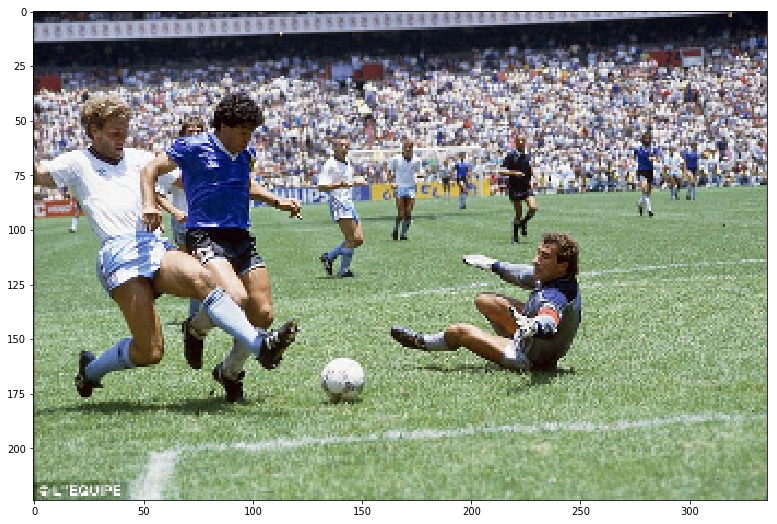

In [5]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/goal.jpg', short=224)
viz.plot_image(img)

In [6]:
pred = net(x.as_in_context(ctx))

In [7]:
classes_fname = download('https://raw.githubusercontent.com/hetong007/gluon-cv/master/scripts/classification/imagenet/imagenet_labels.txt',
                         'imagenet_labels.txt')
with open('imagenet_labels.txt', 'r') as f:
    class_names = [l.strip('\n') for l in f.readlines()]

In [8]:
topK = 5
ind = pred.topk(k=topK).astype('int')[0]
for i in range(topK):
    print('[%s], with probability %.1f%%'%
         (class_names[ind[i].asscalar()], nd.softmax(pred)[0][ind[i]].asscalar()*100))

[soccer_ball], with probability 47.5%
[rugby_ball], with probability 22.9%
[football_helmet], with probability 6.2%
[ballplayer], with probability 1.7%
[baseball], with probability 1.1%


<img src="support/gluon_cv_classification_model_zoo.png" width="600">

# Object Detection

Image classifications are trained to recognize the main object in the scene. What if we have multiple subjects?

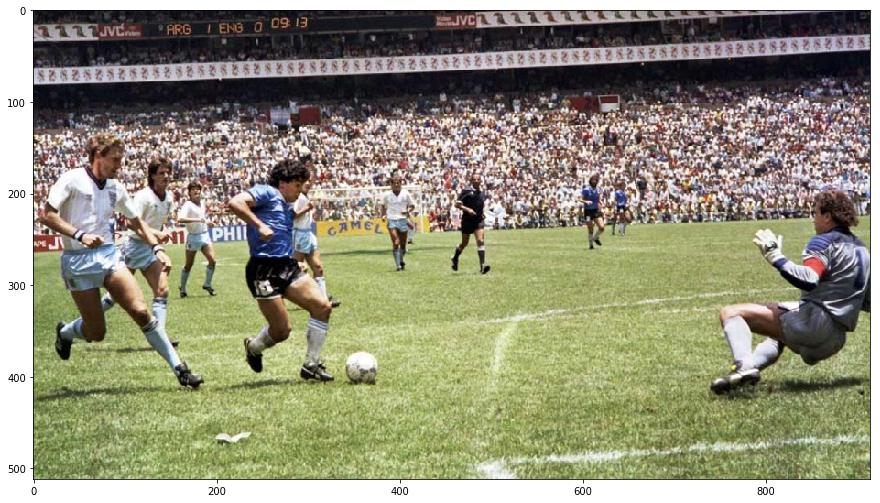

In [9]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/diego.jpg', short=512)
viz.plot_image(img)
plt.show()

We can instead predict with an object detection model **SSD**.
![](support/ssd.png)
![](https://i.stack.imgur.com/Z3cIS.png)

In [10]:
net = get_model('ssd_512_resnet50_v1_coco', pretrained=True, ctx=ctx)

Now we predict. Notice we have three output variables.

In [11]:
class_IDs, scores, bounding_boxes = net(x.as_in_context(ctx))

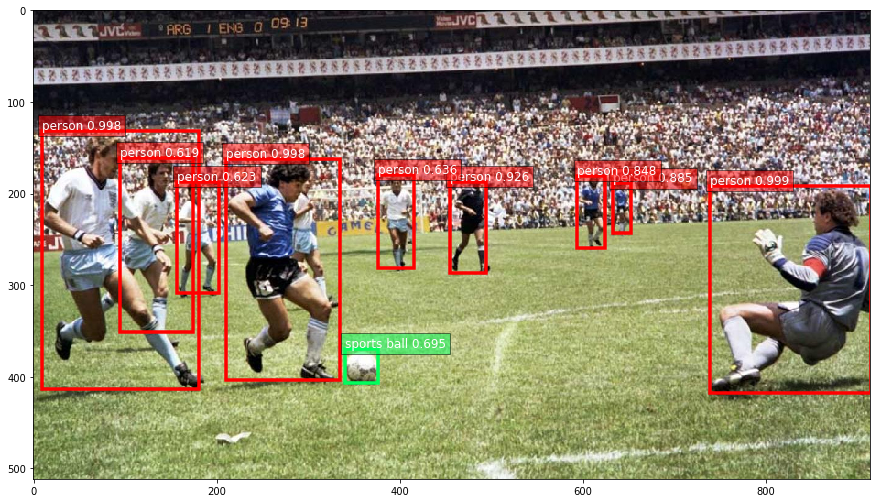

In [12]:
viz.plot_bbox(img, bounding_boxes[0], scores[0], class_IDs[0], class_names=net.classes)
plt.show()

How about we count how many people are here today?

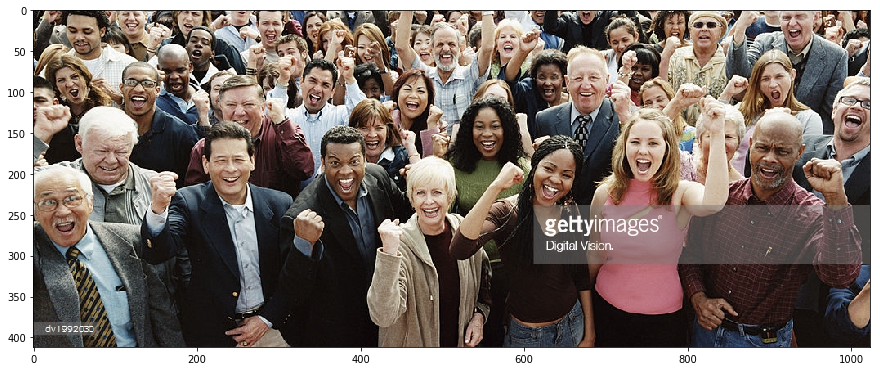

In [13]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/crowd.jpg', short=512)
viz.plot_image(img)
plt.show()

There are 51 people in this photo.


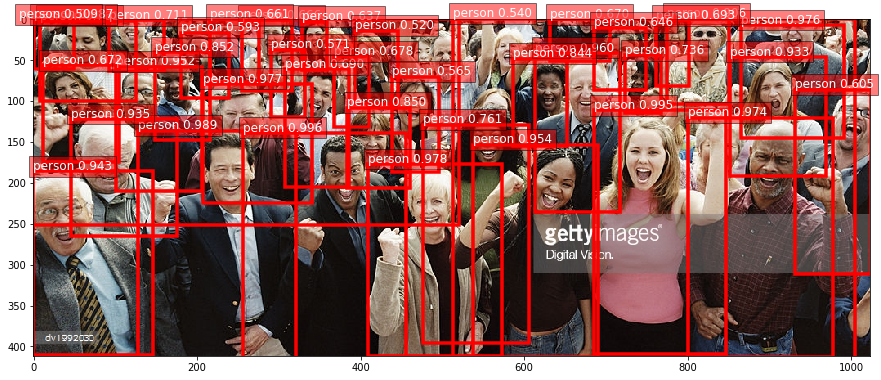

In [14]:
class_IDs, scores, bounding_boxes = net(x.as_in_context(ctx))
person_ind = [i for i, cls in enumerate(net.classes) if cls == 'person']
ind = np.nonzero(class_IDs[0].asnumpy() == person_ind)[0]

new_class_IDs = class_IDs[0][ind]
new_scores = scores[0][ind]
new_bounding_boxes = bounding_boxes[0][ind]

viz.plot_bbox(img, new_bounding_boxes, new_scores, new_class_IDs, class_names=net.classes)

print('There are %d people in this photo.'%(len(ind)))

Another scenario: automated driving.

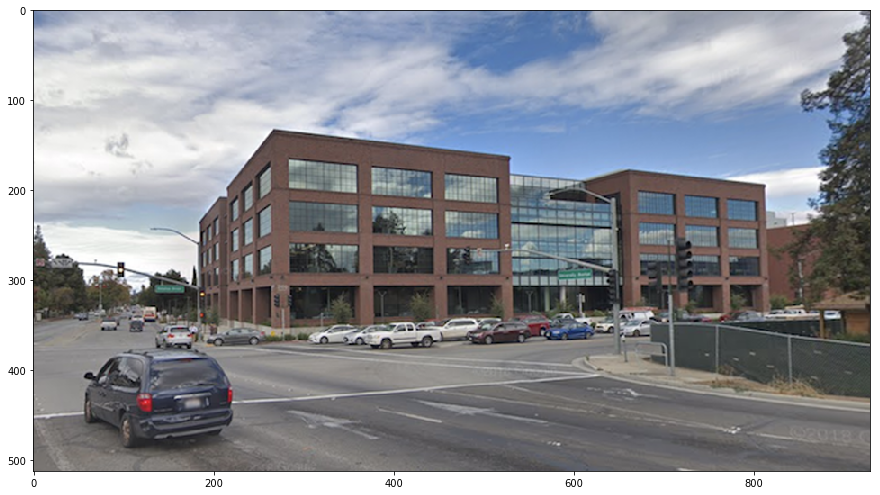

In [15]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/streetview_amazon.png', short=512)
viz.plot_image(img)
plt.show()

In [16]:
class_IDs, scores, bounding_boxs = net(x.as_in_context(ctx))

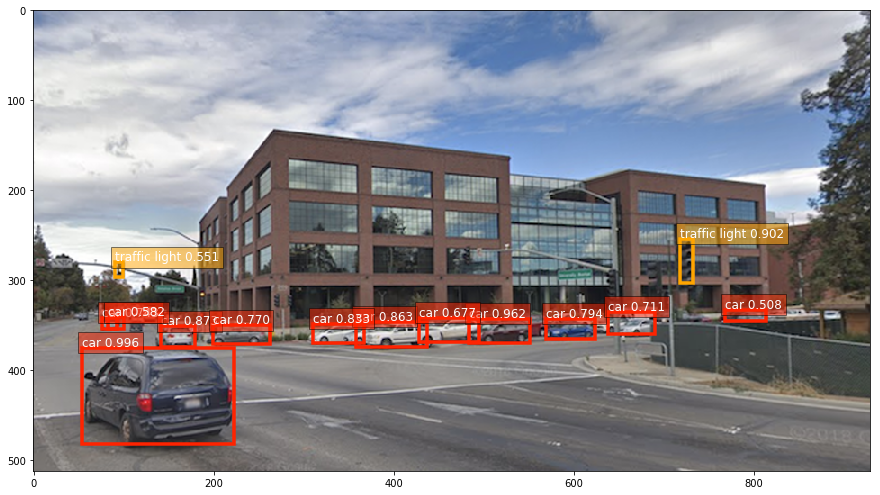

In [17]:
viz.plot_bbox(img, bounding_boxs[0], scores[0], class_IDs[0], class_names=net.classes)
plt.show()

<img src="support/gluon_cv_detection_model_zoo.png" width="600">

### Better performance than original papers

<br>
<img src="support/gluon_cv_models_comparison.png">

[How it was done](https://arxiv.org/abs/1812.01187)

# Semantic Segmentation

Semantic segmentation takes the concept further, by predicting the class for every pixel.

In [18]:
net = get_model('fcn_resnet50_ade', pretrained=True, ctx=ctx)

In [19]:
output = net.demo(x.as_in_context(ctx))
pred = output.argmax(1).asnumpy().squeeze()

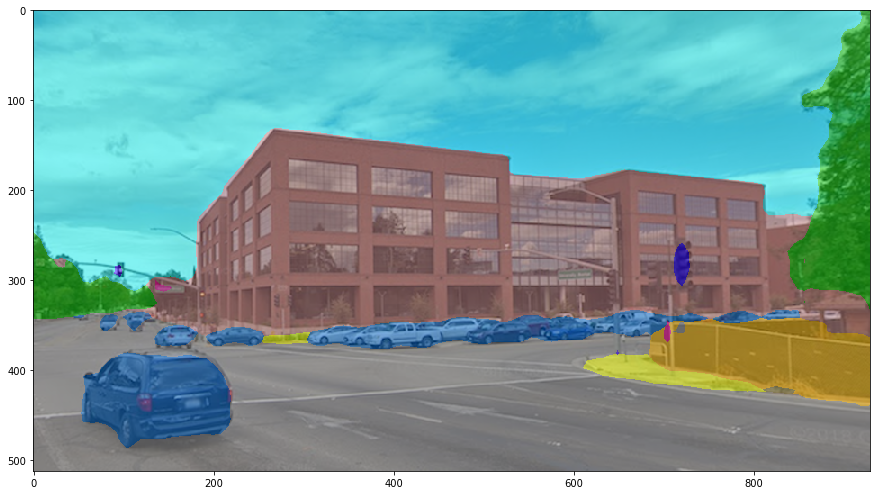

In [20]:
mask = viz.get_color_pallete(pred, 'ade20k')
mask = np.array(mask.convert('RGB'), dtype=np.int)

combined = (mask+img)/2

plt.imshow(combined.astype(np.uint8))
plt.show()

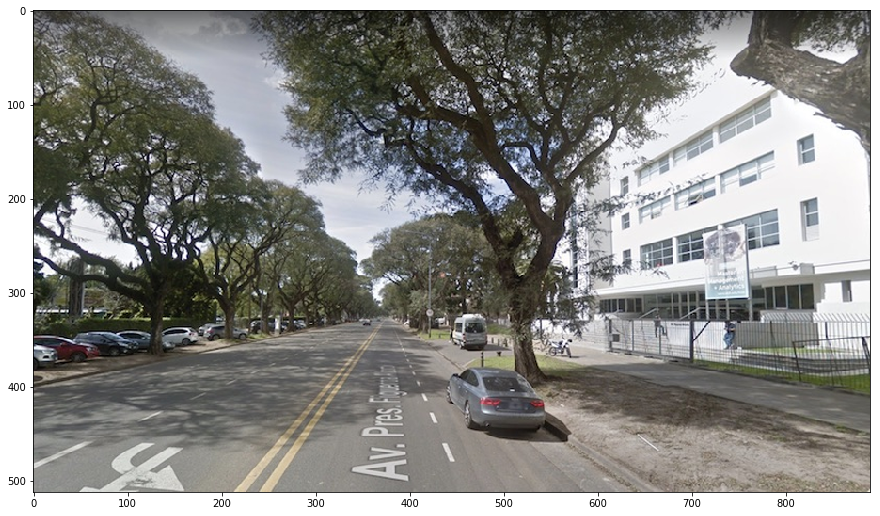

In [21]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/road2.jpg', short=512)
viz.plot_image(img)
plt.show()

In [22]:
output = net.demo(x.as_in_context(ctx))
pred = output.argmax(1).asnumpy().squeeze()

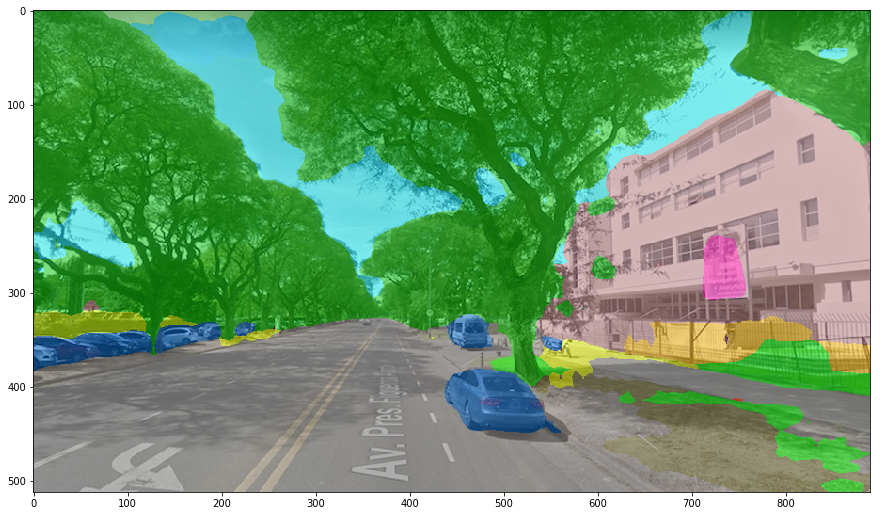

In [23]:
mask = viz.get_color_pallete(pred, 'ade20k')
mask = np.array(mask.convert('RGB'), dtype=np.int)

combined = (mask+img)/2
plt.imshow(combined.astype(np.uint8))
plt.show()

# Instance Segmentation

In [24]:
net = get_model('mask_rcnn_resnet50_v1b_coco', pretrained=True, ctx=ctx)

In [25]:
x, img = gcv.data.transforms.presets.rcnn.load_test('support/road2.jpg')
print('Shape of pre-processed image:', x.shape)

Shape of pre-processed image: (1, 3, 575, 1000)


In [26]:
ids, scores, bboxes, masks = [xx[0].asnumpy() for xx in net(x.as_in_context(ctx))]

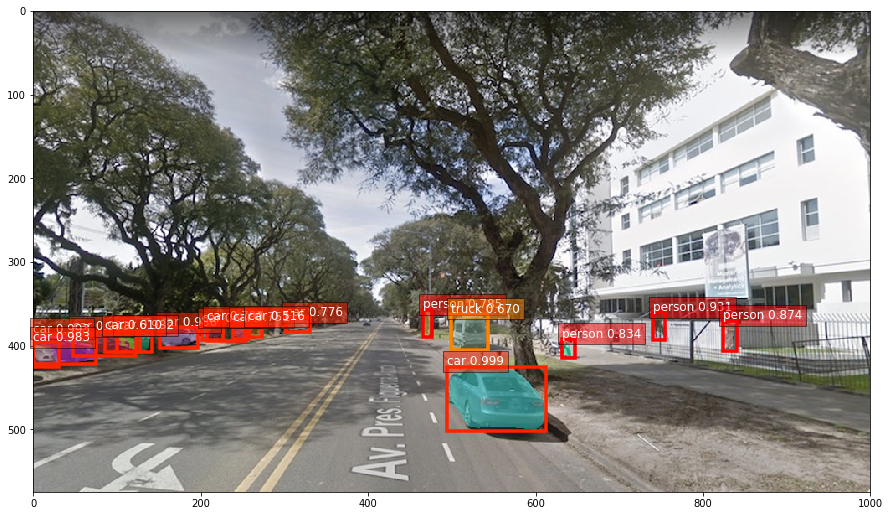

In [27]:
width, height = img.shape[1], img.shape[0]
masks, _ = viz.expand_mask(masks, bboxes, (width, height), scores)
orig_img = viz.plot_mask(img, masks)


ax = viz.plot_bbox(orig_img, bboxes, scores, ids, class_names=net.classes)
plt.show()

# Pose Estimation

In [28]:
from gluoncv.data.transforms.pose import detector_to_simple_pose, heatmap_to_coord

In [29]:
detector = get_model('yolo3_mobilenet1.0_coco', pretrained=True)
pose_net = get_model('simple_pose_resnet18_v1b', pretrained=True)

# Note that we can reset the classes of the detector to only include
# human, so that the NMS process is faster.

detector.reset_class(["person"], reuse_weights=['person'])

In [30]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/diego.jpg', short=512)
print('Shape of pre-processed image:', x.shape)

class_IDs, scores, bounding_boxs = detector(x)

Shape of pre-processed image: (1, 3, 512, 914)


In [31]:
pose_input, upscale_bbox = detector_to_simple_pose(img, class_IDs, scores, bounding_boxs)

In [32]:
predicted_heatmap = pose_net(pose_input)
pred_coords, confidence = heatmap_to_coord(predicted_heatmap, upscale_bbox)

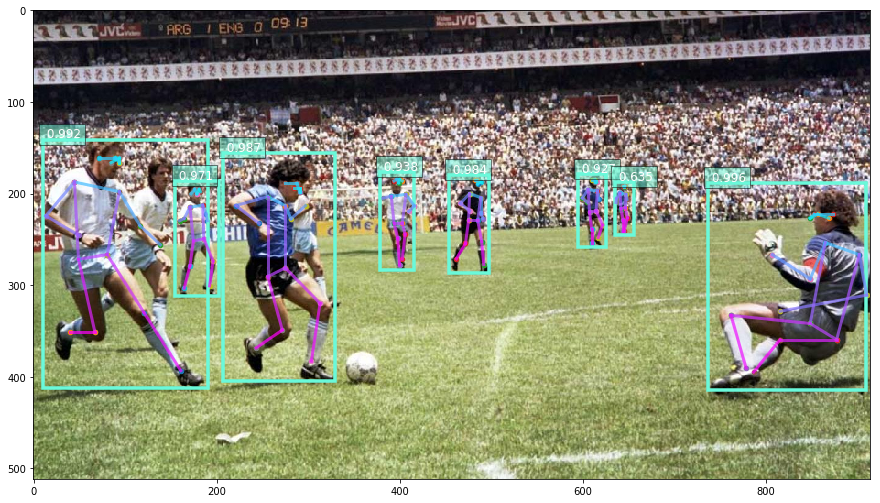

In [33]:
ax = viz.plot_keypoints(img, pred_coords, confidence,
                              class_IDs, bounding_boxs, scores,
                              box_thresh=0.5, keypoint_thresh=0.2)
plt.show()

# Action Recognition


In [34]:
import cv2

url = 'https://github.com/bryanyzhu/tiny-ucf101/raw/master/v_Basketball_g01_c01.avi'
video_fname = download(url)

cap = cv2.VideoCapture(video_fname)
cnt = 0
video_frames = []
while(cap.isOpened()):
    ret, frame = cap.read()
    cnt += 1
    if ret and cnt % 25 == 0:
        video_frames.append(frame)
    if not ret: break

cap.release()
print('We evenly extract %d frames from the video %s.' % (len(video_frames), video_fname))

We evenly extract 5 frames from the video v_Basketball_g01_c01.avi.


<br>
<center><img src="https://gluon-cv.mxnet.io/_static/action_basketball_demo.gif" width=600></center>

In [35]:
transform_fn = transforms.Compose([
    video.VideoCenterCrop(size=224),
    video.VideoToTensor(),
    video.VideoNormalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [36]:
net = get_model('vgg16_ucf101', nclass=101, pretrained=True)

In [37]:
final_pred = 0
for frame_id, frame_img in enumerate(video_frames):
    frame_img = transform_fn(frame_img)
    pred = net(frame_img.expand_dims(axis=0))
    final_pred += pred
final_pred /= len(video_frames)

classes = net.classes
topK = 5
ind = nd.topk(final_pred, k=topK)[0].astype('int')
print('The input video is classified to be')
for i in range(topK):
    print('\t[%s], with probability %.3f.'%
          (classes[ind[i].asscalar()], nd.softmax(final_pred)[0][ind[i]].asscalar()))

The input video is classified to be
	[Basketball], with probability 0.978.
	[TennisSwing], with probability 0.020.
	[SoccerJuggling], with probability 0.002.
	[VolleyballSpiking], with probability 0.000.
	[JavelinThrow], with probability 0.000.
